<a href="https://colab.research.google.com/github/oromiaGodanna/Brain-Imaging_2022_VU/blob/main/Soma_Mapper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploring the primary motor cortex

Project 2 : Soma-Mapper

Thomas Groenewegen 2681903

Oromia Godanna Sero 2720857
 


## Installation 

In [ ]:
# this cell installs some dependencies. 
# feel free to disregard the output this generates

!apt -qq install inkscape > /dev/null
!pip -qq install nibabel nilearn
!pip -qq install git+https://github.com/gallantlab/pycortex.git#egg=pycortex



Extracting templates from packages: 100%
     |████████████████████████████████| 9.6 MB 7.2 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


In [ ]:
# after these basic installs, we can import our required packages. 

import numpy as np
import scipy as sp
import nibabel as nb
import nilearn as nl
from nilearn.surface import load_surf_data
import os, shutil, urllib.request

from matplotlib import rc
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
%matplotlib inline 

### Download of data: surfaces for plotting and project data

Both the surface data we'll use for visualization and the project fMRI data are on figshare.

In [ ]:
#
# this cell ensures that we can work with our own surface from within the colab environment
#

os.makedirs('/content/pycortex/db', exist_ok=True)
os.makedirs('/content/pycortex/colormaps', exist_ok=True)
os.makedirs('/content/data', exist_ok=True)

wrong_filestore_location = 'build/bdist.linux-x86_64/wheel/pycortex-1.3.0.dev0.data/data/share/pycortex/'
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'r') as f:
  file_source = f.read()
replace_string = file_source.replace(wrong_filestore_location, '/content/pycortex/') #save output 
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'w') as f:
  f.write(replace_string)   

os.chdir('/tmp/')
!git clone https://github.com/gallantlab/pycortex.git
!cp /tmp/pycortex/filestore/colormaps/* /content/pycortex/colormaps/

#
# and we'll download our average hcp subject for pycortex visualization
#

pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
!unzip -qq /content/pycortex/db/hcp_999999.zip -d /usr/share/pycortex/db/
#
# and then download the projects' data from figshare
#

timeseries_data_URL = 'https://ndownloader.figshare.com/articles/14096209/versions/3'
urllib.request.urlretrieve(timeseries_data_URL, os.path.join('/content/data', '14096209.zip'))
!unzip -qq /content/data/14096209.zip -d /content/data/
!unzip -qq /content/data/hrf_mapper_59k.zip -d /content/data/hrf_mapper_59k/
!unzip -qq /content/data/prf_mapper_59k.zip -d /content/data/prf_mapper_59k/
!unzip -qq /content/data/soma_mapper_59k.zip -d /content/data/soma_mapper_59k/
!unzip -qq /content/data/atlas.zip -d /content/data/

Cloning into 'pycortex'...
remote: Enumerating objects: 24399, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 24399 (delta 0), reused 1 (delta 0), pack-reused 24395
Receiving objects: 100% (24399/24399), 476.62 MiB | 22.51 MiB/s, done.
Resolving deltas: 100% (18839/18839), done.


In [ ]:
import cortex as cx

Generating a flatmap cache
Failed to get connection
** (inkscape:3181): CRITICAL **: 15:57:28.986: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3181): CRITICAL **: 15:57:28.986: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3181): CRITICAL **: 15:57:28.986: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


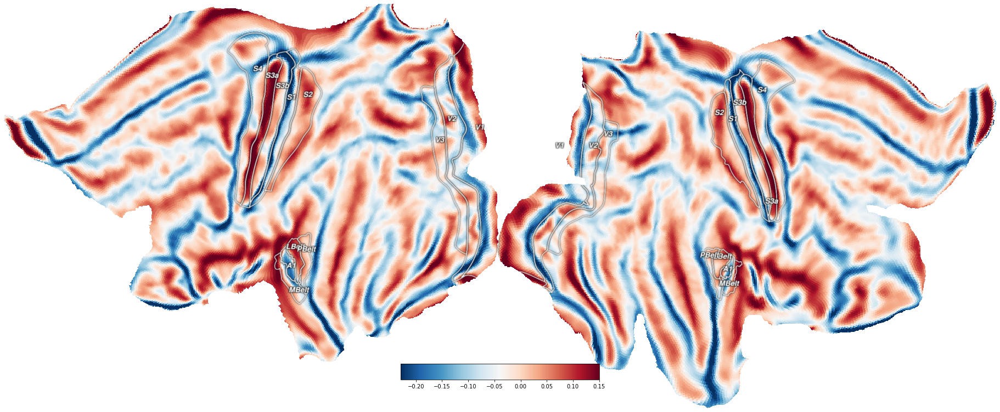

In [ ]:
curv_vertices = cx.db.get_surfinfo(subject='hcp_999999', type='curvature')
cx.quickshow(curv_vertices);

### Flatmaps

But what the hell are we looking at, even? The cortical surface or ribbon is topologically a ball per hemisphere. That is, each hemisphere can be inflated to the shape of a sphere (let's not get stuck on the question how a hemisphere can also be a sphere :-) ). Flatmaps are created by cutting the inflated cortical surface at specific locations (see the black lines in the left figure), and then letting the computer flatten the resulting mesh into a planar surface. 

<img src="https://github.com/VU-Cog-Sci/wiki/raw/master/imgs/flatten/image9.png" alt="where do we cut the surface" width="45%" style="align:left;"/> <img src="https://universe-review.ca/I10-13-BrainMap3.jpg" alt="Visual, auditory and somatosensory brain regions" width="45%" style="align:right;"/>

This flatmapping has the advantage that we can view the entire cerebral cortex in one fell swoop, but the downside is that it is hard to orient yourself to where things are. That's why we've added some lines that surround certain labeled regions of interest - they are the visual, auditory and somatosensory/motor cortex. In the right image they are the blue, red and green areas of the brain, respectively. We're using exactly the flattened surfaces of the right column in the right figure, rendered side-by-side. 


## Loading the functional data for the project

In the cell below we're loading the functional MRI files you'll be working with. There's a different set of files that you open and read depending on the project that you'll be doing. Once loaded, though, all of these datasets have the same format - they're all formatted for the same surface that you've already plotted data into. 

In [ ]:
# Here, I'm using python's awesome f-string functionality to load the data in a structured way across hemisperes. 
# Once the data have been loaded (for plotting and stuff), we don't have to care about hemispheres so much anymore. 
# There are 3 separate versions here, one for each project-dataset.


#########################################################################################################
###############
############### pRF mapping data
###############
#########################################################################################################

# tseries_raw = np.nan_to_num(np.concatenate([load_surf_data(
#         os.path.join('/content/data/prf_mapper_59k', f'sub-02_task-prf_space-59k_hemi-{hemi}_run-median_desc-bold.func.gii'))
#          for hemi in ['L', 'R']]))

#########################################################################################################
###############
############### somatotopic mapping data
###############
#########################################################################################################

tseries_raw = np.concatenate([load_surf_data(
        os.path.join('/content/data/soma_mapper_59k', f'sub-01_ses-01_task-soma_run-median_space-59k_hemi-{hemi}_sg_psc.dtseries.gii'))
         for hemi in ['L', 'R']])

#########################################################################################################
###############
############### hrf mapping data
###############
#########################################################################################################

# tseries_raw = np.concatenate([load_surf_data(
#         os.path.join('/content/data/hrf_mapper_59k', f'sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.{hemi}.dtseries.gii'))
#          for hemi in ['L', 'R']])


# and, we'll check the shape of the data to see whether things make sense
# data should be shaped as vertices by timepoints, and each hemisphere is 59k vertices - hence the name :) 
print(tseries_raw.shape)

(118584, 141)


## Raw Data Observations
### What amount of preprocessing has already been done?

If the signals have been filtered already, there should be no drifts in the data. Also, if the data time-courses have already been z-scored or converted to percent signal change, the mean of the signals should already be 0. If the data are in 'units' of % signal change, the maximal excursions of the signal timecourse will be on the order of 10-20. If they've been z-scored, their standard deviation should be exactly 1.

Failed to get connection
** (inkscape:3190): CRITICAL **: 15:57:40.609: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3190): CRITICAL **: 15:57:40.610: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3190): CRITICAL **: 15:57:40.610: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3193): CRITICAL **: 15:57:47.330: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3193): CRITICAL **: 15:57:47.330: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3193): CRITICAL **: 15:57:47.330: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


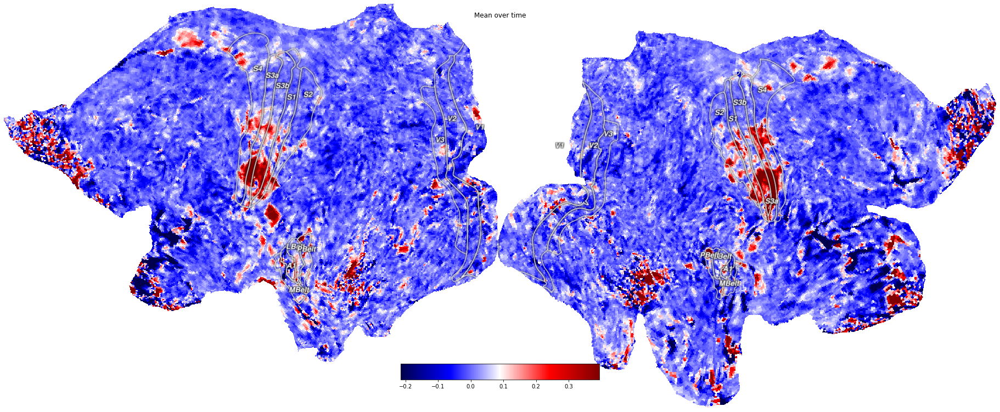

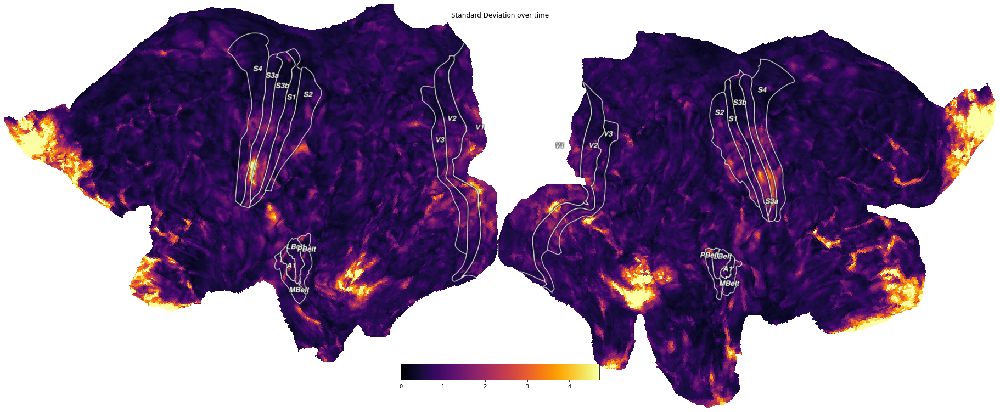

In [ ]:
# Note that we saw in the cell above that the second dimension is time, 
# so the axis on which we take the mean and standard deviation is 1
f = cx.quickshow(cx.Vertex(tseries_raw.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('Mean over time')

f = cx.quickshow(cx.Vertex(tseries_raw.std(axis=1), subject='hcp_999999', cmap='inferno'));
f.suptitle('Standard Deviation over time');

118584


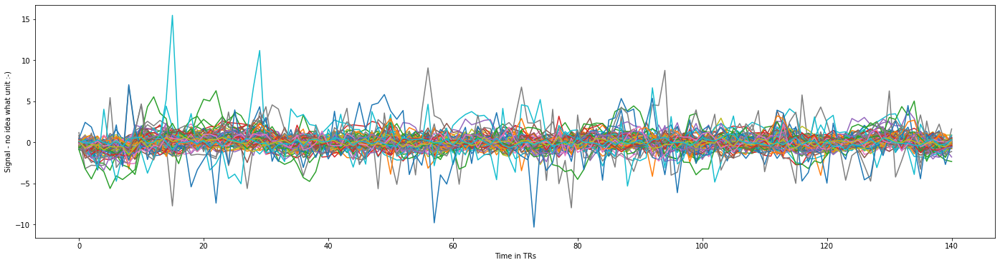

In [ ]:
# now, let's get some random time-courses to check whether there's still drift:
random_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 100)
f = plt.figure(figsize=(24,6))
plt.plot(tseries_raw[random_vertices].T)
plt.xlabel('Time in TRs')
plt.ylabel('Signal - no idea what unit :-)');
print(tseries_raw.shape[0])

##Can we say we don't have a drift here???

### Questions concerning signal quality

From these simple surface and time-course plots above, we can immediately gather a couple of things. Try to answer the following questions from both the flatmaps and the random time-courses. 

1.   have these data been z-scored or percent signal changed? **Check the colorbars!** What would they look like if they'd been z-scored?
2.   have these data been high-pass filtered? **Check the timecourses!**
3.   where do you see the biggest signal fluctuations? What are the likely origins of these fluctuations? 

You can use these insights in writing the data description section of your report! Note that there are differences between the different project-datasets, so make sure you inspect your own!

<font color='red'>-- Important: --</font>

**Your conclusions about the state of the data for your project will tell you what to do: you now have to decide whether to perform additional preprocessing, such as temporal filtering, percent signal change conversion, etc.**

## Atlas tools

It's a very powerful thing to be able to plot stuff on the entire cerebral cortex in one go. But sometimes you want to focus on a single brain region. You can use your own methods to define regions of interest, for example using a separate mapper experiment that allows you to select voxels/vertices of interest - within which you'll then perform your analysis of interest. 

But we'll use the existing multi-modal parcelation atlas from the Human Connectome Project, from the [Glasser et al Nature study](https://www.nature.com/articles/nature18933) that was mentioned a couple of times in the lectures. This is the atlas shown in the right flatmap figure above, in the 'Flatmaps' section.

The following cells show how to select a given ROI's data - something that you may want to do quite a lot in your own analyses. It serves to zoom into a specific region of interest, but also means that you can 'pilot' time-consuming analyses on smaller amounts of data while still taking care to test your entire analysis. 

In [ ]:
# we read in the atlas data, which consists of 180 separate regions per hemisphere. 
# These are labeled separately, so the labels go to 360. 
# To work with them in both hemispheres simultaneously, we mod by 180. 
atlas_data = np.concatenate([load_surf_data(
        os.path.join('/content/data/atlas', f'Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel.{hemi}.gii'))
         for hemi in ['L', 'R']])
atlas_data_both_hemis = np.mod(atlas_data, 180)
print(atlas_data_both_hemis == 1)

[False False False ... False False False]


### Selecting an ROI

One can now easily use a test to create boolean arrays into a specific ROI. For example, we can check which ROI is indexed by the number 1. Make sure you understand what I did with the `vmin` and `vmax` settings of the `Vertex` object! You may be able to use these little tricks later!

Failed to get connection
** (inkscape:3196): CRITICAL **: 15:57:59.544: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3196): CRITICAL **: 15:57:59.545: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3196): CRITICAL **: 15:57:59.545: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


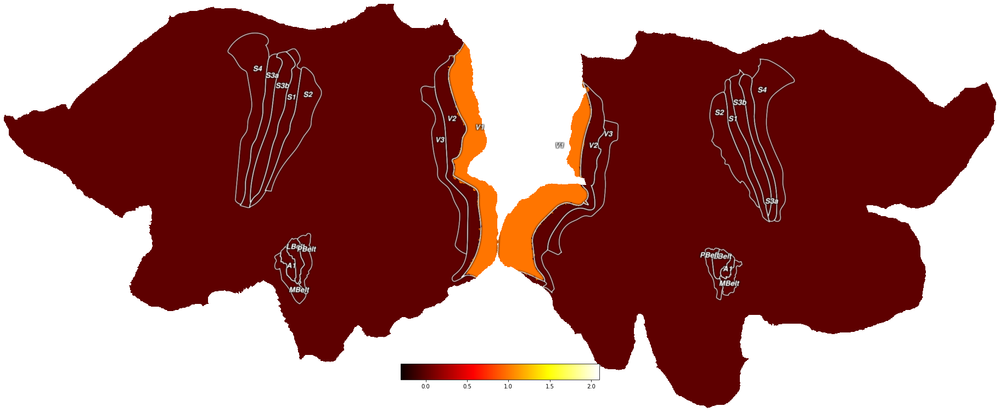

In [ ]:
f = cx.quickshow(cx.Vertex(atlas_data_both_hemis == 1, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1));

This means we can also select those parts of the brain and single out the responses from just a single region of interest! That should be much more manageable. For now, we'll select the region we highlighted above, V1 - the first region of the cortical visual hierarchy. It turns out that 2 out of our 3 experiments did something very very visual, with the third also showing visual stimuli. So let's see what we end up with! Once you've understood the idea of the following code cell, feel free to experiment with the actual index of the ROI this analysis works with!

***Note 1:*** whether this raw data visualization is very informative depends on your experiment. So, don't worry if this doesn't show you anything here. 

***Note 2:*** See how I'm trying to label all my figure axes so that it's clear what the units and elements of the data are? **It's very important that you do the same for your report!**

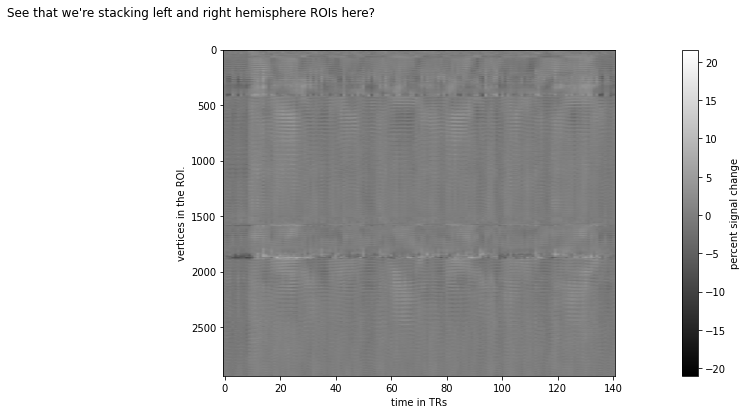

In [ ]:
roi_boolean_mask = atlas_data_both_hemis == 1

# but let's look at the actual signals after percent signal change conversion. 
def psc(data):
  """take percent signal change of data along axis 1. 
  This implementation is a bit idiosyncratic since 
  it uses the median instead of the mean of the signal.
  For sparse signals with very strong activations (such as those at 7T)
  this approach makes sense. Can you imagine why?"""
  # crudely checking whether psc hasn't already happened, in which case do nothing
  if np.mean(data) < 0.5:
    return data
  return ((data.T/np.median(data, 1)).T - 1) * 100

f = plt.figure(figsize=(24,6))
plt.imshow(psc(tseries_raw[roi_boolean_mask]), aspect=1/25, cmap='gray')
plt.xlabel('time in TRs')
plt.ylabel('vertices in the ROI.')
plt.colorbar(label='percent signal change')
f.suptitle("See that we're stacking left and right hemisphere ROIs here?");

To help you out a bit, here's a dictionary that gives you the indices in the atlas for the regions that are outlined in the flatmaps. This may help you find your way later on :-)

In [ ]:
roi_index_dict = {
    # somatosensory:
    'CS1_4': 8, 'CS2_3a': 53, 'CS3_3b': 9, 'CS4_1': 51, 'CS5_2': 52,
    # auditory:
    'A1': 24, 'PBelt': 124, 'MBelt': 173, 'LBelt': 174, '52': 103, 'RI': 104,
    # low-level visual:
    'V1': 1, 'V2': 4, 'V3': 5,
    # mid-level and high-level visual:
    'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
    'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159
    }

#**Soma**-Mapper




## Somatotopic Mapper: the Experiment. 

This experiment was conducted by Ines, the course TA, for her PhD project. It's a motor mapper - and not a somatosensory mapper like in one of the original articles - that served to map out the subject's motor strip in the central sulcus. 

Subjects viewed a movie of an avatar that moved its facial muscles, hands and legs in a quasi-cyclic order that was identical across runs. On some cycles subjects moved both hands/legs, and on some they only moved one side. With a design like this we can investigate and chart not just the lateralized motor map, but also whether responses in for example the right-hand region are similar when we move the right hand, or both. You can see example timecourses from two voxels; one from the hand and one from the face. There are even [studies reporting pRF-like analyses](https://www.sciencedirect.com/science/article/pii/S105381191830569X) (see the pRF project if you want to know more) on experiments such as these. But for now, we won't be going there. 

The data that we will analyze here is the average across 5 runs for a single subject. We don't want to be "scraping the bottom of the barrel", so using this averaged data means that it is very high-signal data, and we can go into detail a bit. We will analyze these data using a 'standard' GLM, and will then inspect the sensitivities along the central sulcus. **Can we find the hand-, leg-, and face regions of the motor cortex? Let's find out!**



## Experimental Design

This experimental design is a blend between an event-related and a block design. We can find what happened when on the screen by inspecting what's in the `events.tsv` file. Files like this are standard BIDS formatted meta-data, that allow other researchers to immediately understand what we did (with the explanations in the paper, of course). 

Let's see if we can make sense of this. 

In [ ]:
import pandas as pd
expt_df = pd.read_csv('/content/data/soma_mapper_59k/sub-01_ses-01_task-soma_run-median_events.tsv', sep='\t')
expt_df.head(20)


,Unnamed: 0,onset,duration,trial_type
0,0,11.988714,2.250143,eyebrows
1,1,15.335506,2.251704,eyes
2,2,18.689733,2.250188,mouth
3,3,22.034835,2.250071,tongue
4,4,25.376571,2.254236,lhand_fing1
5,5,28.709952,2.255005,lhand_fing2
6,6,32.043396,2.250697,lhand_fing3
7,7,35.385158,2.250085,lhand_fing4
8,8,38.718646,2.250125,lhand_fing5
9,9,42.047893,2.251309,lleg


### Experimental timecourse

This provides quite a complete description of what happened when. For example, you see that events on lines 14 and 15 occurred simultaneously; both hands were moved at this point in time. But event nr 4 was just the left hand's finger 1 moving.  

With this information we can start to construct our design matrix. The idea here is exceedingly similar to our earlier notebook practicals (so you'll be able to re-use a lot of things that you've learned there), but now our design is a bit more complicated. But, we're also more experienced scientists so we'll be fine. Let's get going. 

In [ ]:
# what types of stimuli were shown, and what bodyparts were actually moved?
# unique_event_types = np.unique(expt_df['trial_type'])
# print(unique_event_types)

# let's order these in a sensible way so that when we decide to loop over them, 
# it's easy to keep in mind what we're doing
unique_event_types = ['eyebrows', 'eyes', 'mouth', 'tongue', 'lhand_fing1', 'lhand_fing2', 'lhand_fing3', 'lhand_fing4', 'lhand_fing5', 'lleg',  'rhand_fing1', 'rhand_fing2', 'rhand_fing3',
 'rhand_fing4', 'rhand_fing5', 'rleg']

# so, we can use the pandas DataFrame 
# to easily take the event times for an example event type
# you can use this simple syntax yourself lateron
event_times = np.array(expt_df[expt_df['trial_type'] == 'rhand_fing2']['onset'])
print(event_times)

[ 62.07765055  95.42452204 168.97256398 202.53610504]


[1. 1. 1. 1.]


/usr/local/lib/python3.7/dist-packages/nilearn/glm/__init__.py:56: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  'It may change in any future release of Nilearn.', FutureWarning)


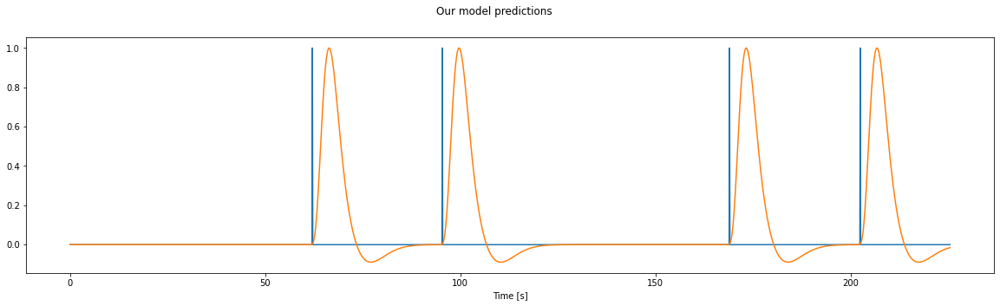

In [ ]:
# okay, now that we have event times, we'll be able to create a fine-timing timecourse. 
# I will tell you a secret: the TR in this experiment was 1.6s - you can find this info
# in the figshare website also. 
tr = 1.6

# create 0.1 s timescale regressor, and fill in the events
upscaled_times = np.arange(0, tseries_raw.shape[1]*tr, 0.1)
neural_event_timecourse = np.zeros(int(tseries_raw.shape[1]*tr*10))
# we'll pretend the events were instantaneous, since this will not
# impact the expected response shapes much
neural_event_timecourse[np.round(event_times * 10).astype(int)] = 1 
print(neural_event_timecourse[np.round(event_times * 10).astype(int)])

from nilearn.glm.first_level.hemodynamic_models import _gamma_difference_hrf

hrf = _gamma_difference_hrf(tr=tr ,oversampling=16, onset=-tr/2)
hrf /= hrf.max() # <- normalize HRF

bold_event_timecourse = np.convolve(neural_event_timecourse, hrf, 'full')[:neural_event_timecourse.shape[0]]

f = plt.figure(figsize=(20,5))
plt.plot(upscaled_times, neural_event_timecourse, label='neural')
plt.plot(upscaled_times, bold_event_timecourse, label='BOLD')
plt.suptitle('Our model predictions')
plt.xlabel('Time [s]');

## First GLM 

Now that we've got a single-regressor design matrix, we can start to perform a GLM analysis on the brain. We'll first look at explained variance and beta weights to get an idea of whether this all makes sense. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  after removing the cwd from sys.path.


Failed to get connection
** (inkscape:3200): CRITICAL **: 15:58:05.023: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3200): CRITICAL **: 15:58:05.023: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3200): CRITICAL **: 15:58:05.023: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3203): CRITICAL **: 15:58:06.352: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3203): CRITICAL **: 15:58:06.352: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3203): CRITICAL **: 15:58:06.352: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


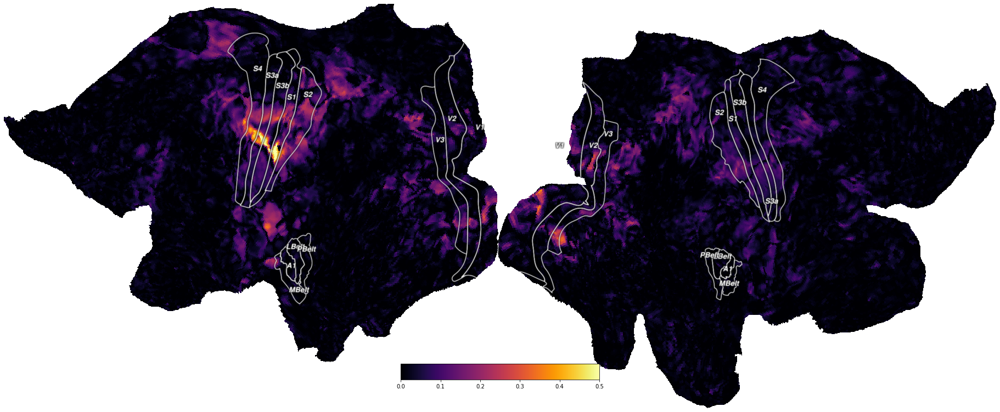

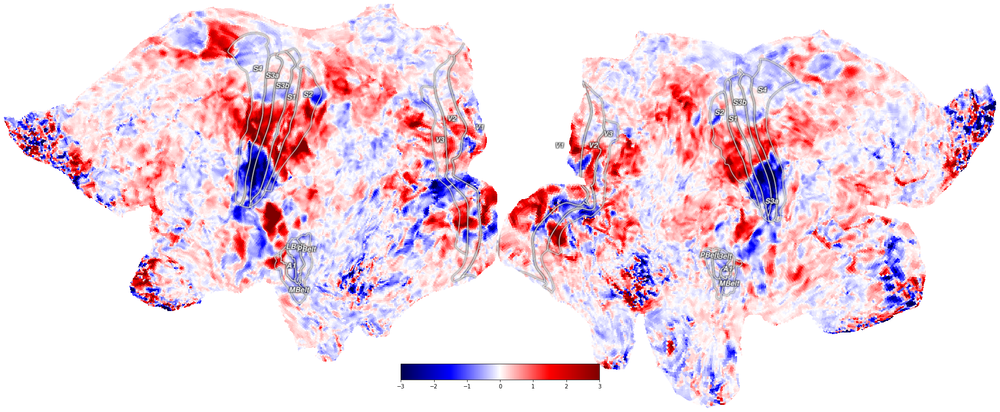

In [ ]:
sub_sampled_regressor = bold_event_timecourse[::16]
dm = np.vstack([np.ones_like(sub_sampled_regressor), sub_sampled_regressor]).T

betas, _, _, _ = np.linalg.lstsq(dm, tseries_raw.T)
# let's look at betas[1], since those are our tongue betas 

yhat = np.dot(betas.T, dm.T)
rsq = 1-(yhat-tseries_raw).var(1)/tseries_raw.var(1)

# we can visualize the rsq and beta weights separately
f1 = cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0, vmax=0.5));

masked_betas = betas[1]
# masked_betas[rsq < 0.3] = np.nan

f2 = cx.quickshow(cx.Vertex(masked_betas, subject='hcp_999999', cmap='seismic', vmin=-3, vmax=3, alpha=rsq));

# or use one to mask the other using a 2D Vertex object, and plotting that. 
# there seems to be a rendering issue, but we'll leave it at this.
# f12 = cx.quickshow(cx.Vertex2D(rsq, betas[1], subject='hcp_999999', cmap='BuWtRd_alpha', vmin=0.1, vmax=1, vmin2=-3, vmax2=3));

## More complete GLM

OK, now that we're starting to see that we can find something going on in motor cortex (and get positive and negative beta weights), we need to run a full GLM with all event types simultaneously encoded in the design matrix. 

You see, there's a conceptual problem with running all of these regressors in separate GLMs, and you can see from this last figure. We used the right hand finger regressor, but we also see right (and not contralateral left) give a similar if fainter pattern of BOLD responses. From the earlier explanations you should be able to answer the question: _"Why is that?"_

In any case, we'll need to perform an actual GLM to get around this problem, so that is what we'll do. Our first task is to convert the above code into a function that creates the regressors and cleans things up a bit. For further code that you'll write yourselves, follow this example: if things become more complicated in terms of analysis it often helps to provide more structure in your code. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


Failed to get connection
** (inkscape:3207): CRITICAL **: 15:58:15.110: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3207): CRITICAL **: 15:58:15.110: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3207): CRITICAL **: 15:58:15.110: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


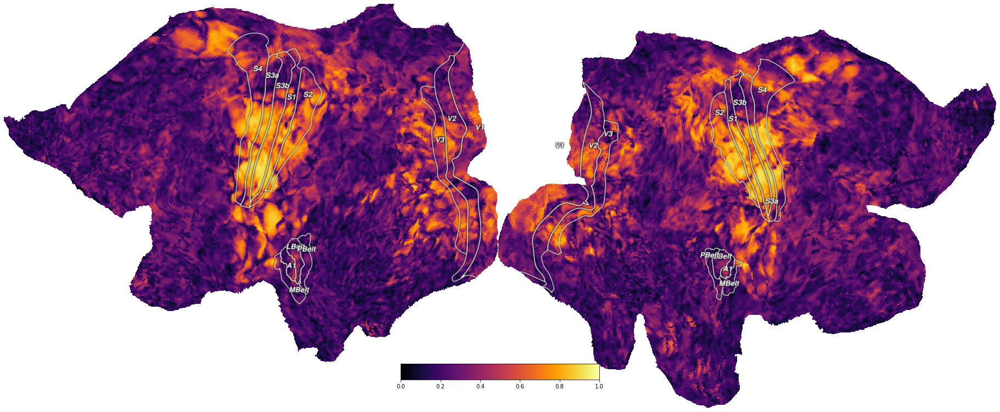

In [ ]:
def create_BOLD_regressor(event_times, n_timepoints, tr=1.6, supersampleratio=10):

    # create 0.1 s timescale regressor, and fill in the events
    upscaled_times = np.arange(0, n_timepoints*tr, 1/supersampleratio)
    neural_event_timecourse = np.zeros(int(n_timepoints*tr*supersampleratio))
    # we'll pretend the events were instantaneous, since this will not
    # impact the expected response shapes much. For events with variable durations
    # you'll want to make sure this doesn't happen :-)
    neural_event_timecourse[np.round(event_times * supersampleratio).astype(int)] = 1 

    hrf = _gamma_difference_hrf(tr=tr ,oversampling=tr*supersampleratio, onset=-tr/2)
    hrf /= hrf.max() # <- normalize HRF

    bold_event_timecourse = np.convolve(neural_event_timecourse, hrf, 'full')[:neural_event_timecourse.shape[0]]
    sub_sampled_regressor = bold_event_timecourse[::int(tr*supersampleratio)]
    return sub_sampled_regressor

def create_design_matrix(regressor_types, expt_df, data):
    regressors = [np.ones(data.shape[1])]
    for regressor_type in regressor_types:
        event_times = np.array(expt_df[expt_df['trial_type'] == regressor_type]['onset'])
        regressors.append(create_BOLD_regressor(event_times, data.shape[1]))
    return np.array(regressors)

dm = create_design_matrix(regressor_types=unique_event_types, expt_df=expt_df, data=tseries_raw)

betas, _, _, _ = np.linalg.lstsq(dm.T, tseries_raw.T)
yhat = np.dot(betas.T, dm)

rsq = 1-(yhat-tseries_raw).var(1)/tseries_raw.var(1)

f1 = cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0, vmax=1));

## Some interpretation.

Boom, that's a lot of explained variance in different parts of the brain! We're plotting the proportion of within-set explained variance of the GLM analysis up there. What does this pattern mean? There is a clear pattern around the central sulcus. But a few other things seem to 'light up' too. Some of these correspond to known somatotopy like the maps we know from the papers we've read. 

**But others don't. Can you identify these and explain why we do see them here?**

You will likely see these weird regions pop up in later requested analyses, too. Your interpretation is essential here, and should be reflected in your writing of the report. Also, don't forget to mention your choices in terms of preprocessing. 

## Your task

<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/Hj9spSs.png" alt="Homunculus" width="600" align="right" />

The nice part about these maps is that they give us something to hold on to - we know that we should be seeing them, we know that our bodies are represented contralaterally, and we know that there should be a set of somatotopic gradients. But how exactly do they run in this subject? For example, as you see, the ordering of the fingers on the Homunculus maps to the right are a bit ambiguous. Also, in much of the preceding literature such as the Zeharia study linked to above, the data were quite strongly smoothed. We're not doing that here, because it would diminish our spatial detail. Keep in mind that we're likely going to be looking at more detailed gradients than you see in those older studies. 

**Diving into the map structure of somatotopic cortex is your task for this project report.** Create the following visualizations:

1. Show the T-statistic of the contrast of "right hand" vs "left hand" to signify contralaterality of the hand representations. This should give you a broad idea of where the hand representation is in our S-named regions of interest (the ones that are green in the HCP flatmap explanation above). Use your knowledge from the glm practical to calculate these statistics, and use a t-statistic threshold of 4 in your visualizations. Do the same for the left foot vs the right foot. 
2. Then, contrast the face vs an implicit baseline (an unbalanced contrast)
    - Is the very coarse map of faces, hands, and feet we're seeing until now contiguous on the surface? Or are there some holes? If not, why do you think this is the case? Can you tie this back to the different regressors we have in our design?
3. Now, subdivide the hand into its fingers, and test the left vs right contrast for each finger. For this analysis, create 5 separate flatmaps. 
4. But how are these ordered? Kind of hard to see now, with these separate figures. In the end, we want to create the actual somatotopic gradient on the surface! This is what we'll do. 
    - The first step is to figure out the winning finger for each voxel - use `np.argmax` for this. 
    - Now, re-code this such that you create a finger-line, running as follows: `[-5, -4, -3, -2, -1, 1, 2, 3, 4, 5]`. That is, from the left pinky to thumb and then from the right thumb to pinky. Set everything outside the hand regions you found in the previous analysis to `0` or `np.nan`. Now, visualize this using the `CyanBlueGrayRedPink`, `nipy_spectral`, or `J4` colormaps to bring about the finger maps on the surface. Or, if you come up with your own coloring, by all means go ahead! Is this map monotonic? In your report, you should relate these qualities of the map to the literature we gave you, and literature that you've discovered yourself.
    - In this experiment, subjects' movements would also have produced sensations. This means it's likely that you'll see these maps both in somatosensory AND motor cortex. In the Homunculus figure shown to the right here, there are slight differences between the two. Do your findings replicate this?
5. Lastly, what about the face? Create a similar gradient representation of the face, top to bottom. What part of the face is most strongly represented? Is the resulting map monotonic? Again, what have you found about this map in the literature?
6. **bonus** Oftentimes, neural tuning isn't about just the peak tuning location, but also the width of the tuning function. Specifically, we'd expect the tuning width to broaden as we move away from the primary regions towards more high-level regions. Can you think of a way to quantify this 'tuning width' for this experiment? And if so, can you plot this on the surface, as well as for different ROIs? 
7. **bonus** **bonus** Perhaps you guessed it, you could answer question [6.] if you fit a somatotopic pRF model to the data, exactly according to how [this paper](https://www.sciencedirect.com/science/article/pii/S105381191830569X) did it. That is, you can try to fit the soma-pRFs using the `gauss1D_cart` function below, on the beta values that come from the GLM for just the left hand, just the right hand, and/or just the face. Like in a visual pRF experiment, the outcomes would be the peak of the pRF ($\mu$ or `mu`, which should be identical/similar to the outcomes of your answer to question 4) and the width of the tuning in the body part. In auditory and visual cortex, these tuning widths become broader as we move up the auditory and visual hierarchies - is that the case also for these somatotopic maps? You can answer these questions by plotting the tuning width on the surface.

In [ ]:
def gauss1D_cart(x, mu=0.0, sigma=1.0):
    """gauss1D_cart

    gauss1D_cart takes a 1D array x, a mean and standard deviation,
    and produces a gaussian with given parameters, with a peak of height 1.

    Parameters
    ----------
    x : numpy.ndarray (1D)
        space on which to calculate the gauss
    mu : float, optional
        mean/mode of gaussian (the default is 0.0)
    sigma : float, optional
        standard deviation of gaussian (the default is 1.0)

    Returns
    -------
    numpy.ndarray
        gaussian values at x
    """

    return np.exp(-((x-mu)**2)/(2*sigma**2))

In [ ]:
def generate_t_vals(contrast_vector, betas, threshold = 4):
    c_betas = np.dot(contrast_vector, betas)
    print(betas.shape)

    N = tseries_raw.shape[1]
    P = betas.shape[0]
    df = (N - P)

    sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df
    des_var = contrast_vector.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector.T)

    t = c_betas / np.sqrt(sigma_hat * des_var)
    t[np.abs(t) < threshold] = 0
    return t


(17, 118584)
Failed to get connection
** (inkscape:3211): CRITICAL **: 15:58:19.453: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3211): CRITICAL **: 15:58:19.454: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3211): CRITICAL **: 15:58:19.454: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


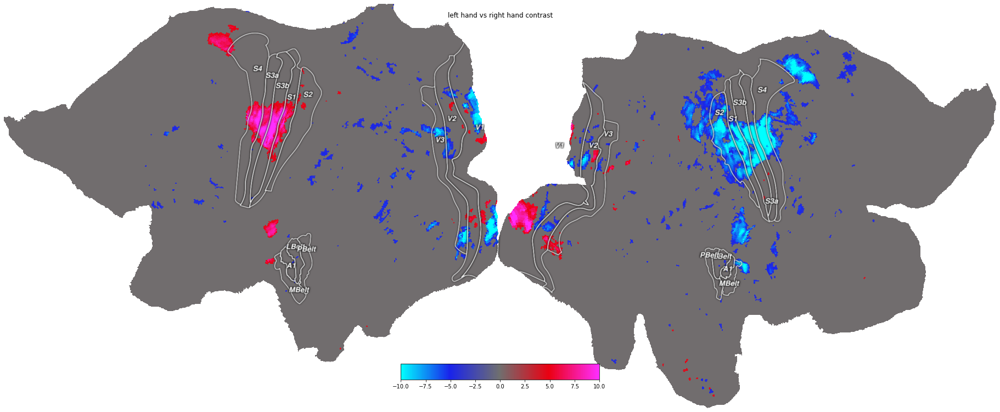

In [ ]:
#1 hands left vs right
rhands = np.array([1 if 'rhand' in uet else 0 for uet in unique_event_types])
lhands = np.array([-1 if 'lhand' in uet else 0 for uet in unique_event_types])
contrast_vector_hands = np.r_[0, rhands+lhands] # the intercept regressor was never in the event types list


f2 = cx.quickshow(cx.Vertex(generate_t_vals(contrast_vector_hands, betas), subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left hand vs right hand contrast');

[ 0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  1]
(17, 118584)
Failed to get connection
** (inkscape:3400): CRITICAL **: 16:11:16.868: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3400): CRITICAL **: 16:11:16.868: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3400): CRITICAL **: 16:11:16.868: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


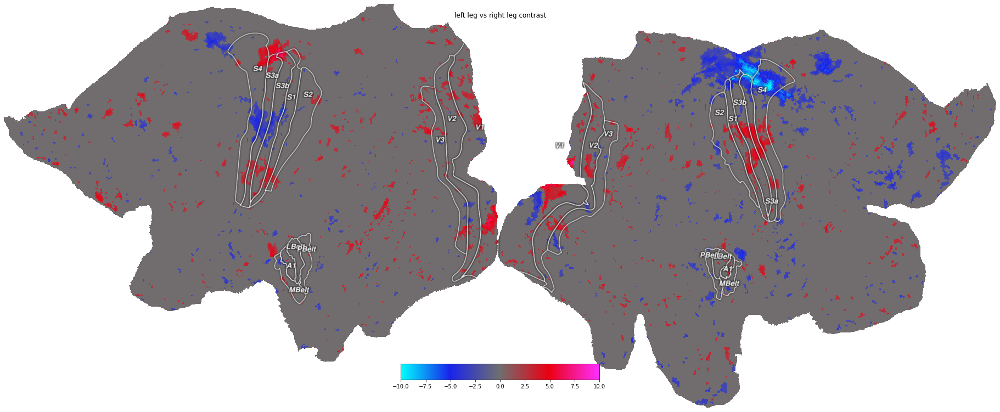

In [ ]:
##1 -- foot
'''
unique_event_types = ['eyebrows', 'eyes', 'mouth', 'tongue', 'lhand_fing1', 'lhand_fing2', 'lhand_fing3', 'lhand_fing4', 'lhand_fing5', 'lleg',  'rhand_fing1', 'rhand_fing2', 'rhand_fing3',
 'rhand_fing4', 'rhand_fing5', 'rleg']
'''
rlegs = np.array([1 if 'rleg' in uet else 0 for uet in unique_event_types])
llegs = np.array([-1 if 'lleg' in uet else 0 for uet in unique_event_types])
contrast_vector_foot = np.r_[0, rlegs+llegs] # the intercept regressor was never in the event types list
print(contrast_vector_foot)

f2 = cx.quickshow(cx.Vertex(generate_t_vals(contrast_vector_foot, betas), subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left leg vs right leg contrast');

[0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
(17, 118584)
Failed to get connection
** (inkscape:3219): CRITICAL **: 15:58:27.714: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3219): CRITICAL **: 15:58:27.715: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3219): CRITICAL **: 15:58:27.715: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


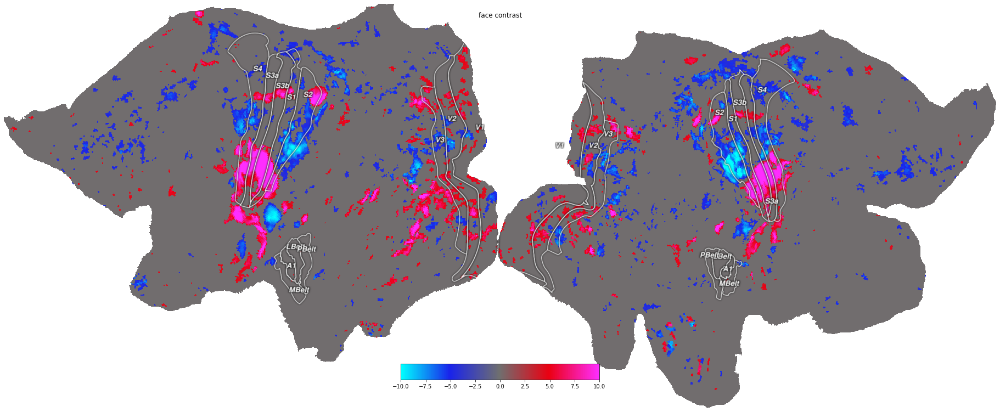

In [ ]:
##2
face = np.array([1 if 'hand' not in uet and 'leg' not in uet else 0 for uet in unique_event_types])
contrast_vector_face = np.r_[0, face] 
print(contrast_vector_face)

f2 = cx.quickshow(cx.Vertex(generate_t_vals(contrast_vector_face, betas), subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('face contrast');

[ 0  0  0  0  0 -1  0  0  0  0  0  1  0  0  0  0  0]
(17, 118584)
Failed to get connection
** (inkscape:3410): CRITICAL **: 16:11:51.220: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3410): CRITICAL **: 16:11:51.220: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3410): CRITICAL **: 16:11:51.220: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
[ 0  0  0  0  0  0 -1  0  0  0  0  0  1  0  0  0  0]
(17, 118584)
Failed to get connection
** (inkscape:3414): CRITICAL **: 16:11:54.482: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3414): CRITICAL **: 16:11:54.482: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3414): CRITICAL **: 16:11:54.482: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
[ 0  0  0  0  0  0  0 -1  0  0  0  0  0  1  0  0  0]
(17, 118584)
Failed to get connection
** (inkscape:3420): CRITICAL **: 16:11:58

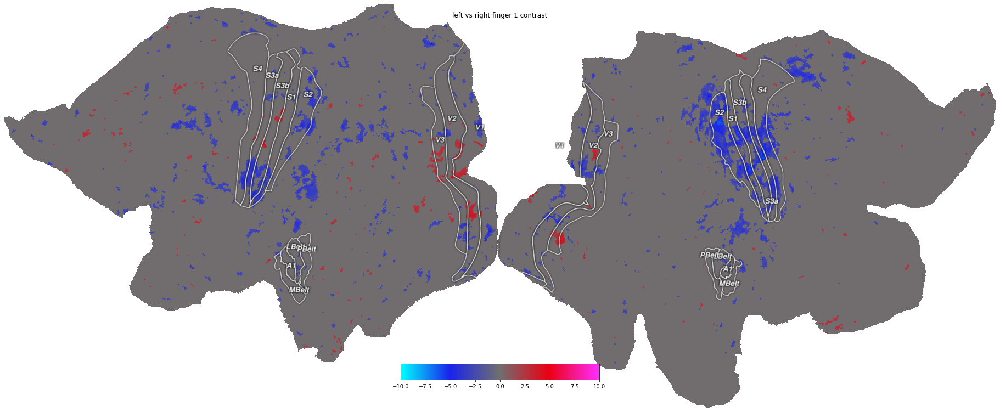

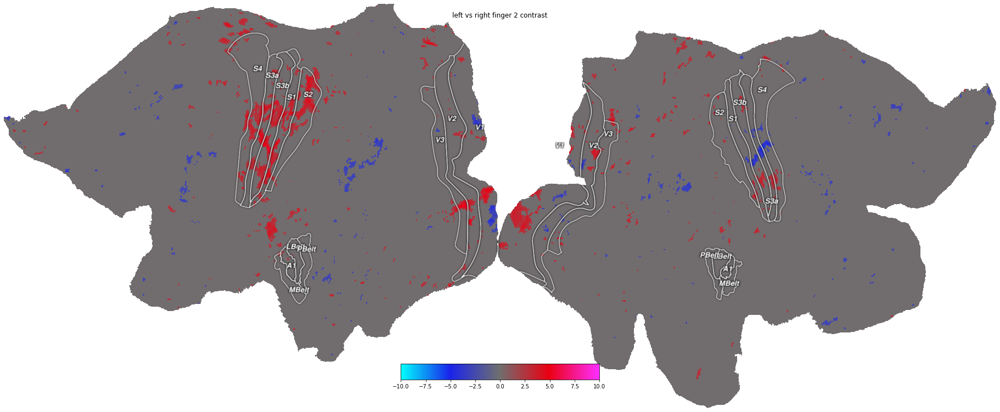

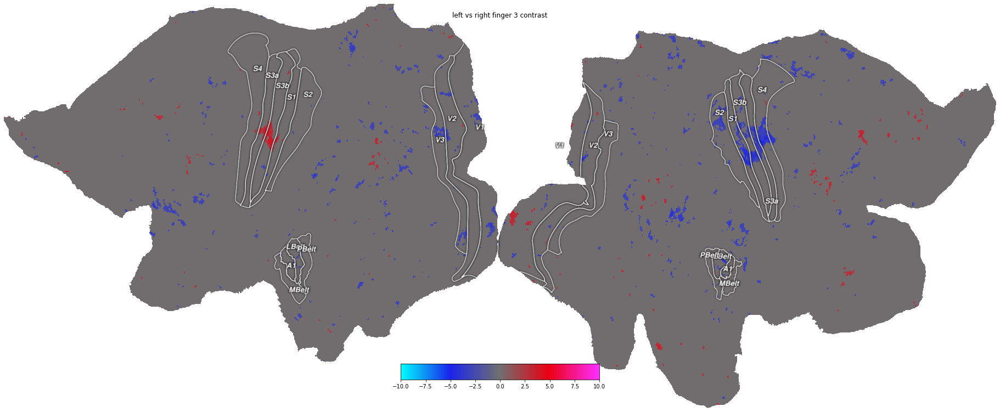

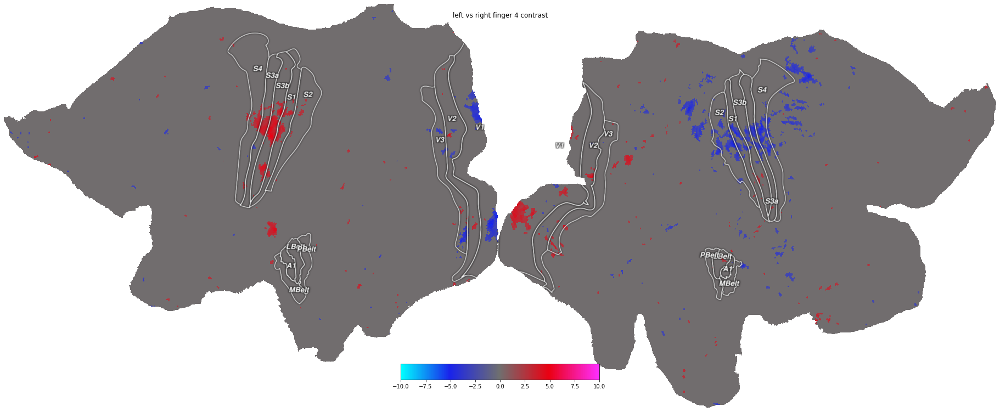

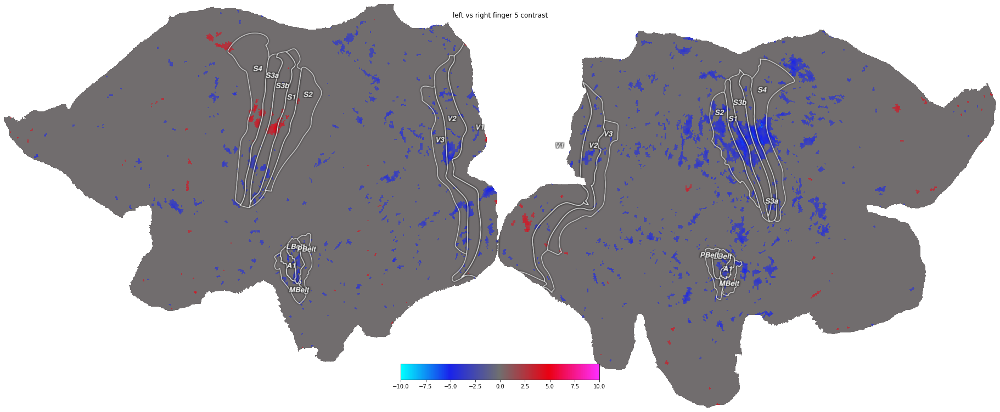

In [ ]:
##3 each fingers

fingers_index = [1, 2, 3, 4, 5]
for i in fingers_index:  
  rfinger = np.array([1 if uet.startswith('rhand') and uet.endswith(str(i)) else 0 for uet in unique_event_types])
  lfinger = np.array([-1 if uet.startswith('lhand') and uet.endswith(str(i)) else 0 for uet in unique_event_types])
  contrast_vector_each_finger = np.r_[0, rfinger+lfinger] # the intercept regressor was never in the event types list
  print(contrast_vector_each_finger)

  f2 = cx.quickshow(cx.Vertex(generate_t_vals(contrast_vector_each_finger, betas, 2.4), subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
  f2.suptitle('left vs right finger %d contrast' %i);

In [ ]:
##4

In [ ]:
tseries = np.nan_to_num(tseries_raw)

In [ ]:
# get the beta values from the fingers set others to zero
rhands = np.array([1 if 'rhand' in uet else 0 for uet in unique_event_types])
lhands = np.array([1 if 'lhand' in uet else 0 for uet in unique_event_types])
contrast_vector = np.r_[0, rhands+lhands] 
new_betas = betas.T*contrast_vector

#check if correct betas are set to zero
print(contrast_vector)
print(new_betas[0])

[0 0 0 0 0 1 1 1 1 1 0 1 1 1 1 1 0]
[ 0.         -0.         -0.          0.         -0.         -0.35020082
 -0.08036775 -0.09458412 -0.20651394  0.24541011 -0.          0.62363821
 -0.55475945  0.58236291 -1.16135293  0.37123824 -0.        ]


In [ ]:

# get the tvalues from hand to determine the ROI
# c_betas = np.dot(contrast_vector, betas)

# N = tseries.shape[1]
# P = betas.shape[0]
# df = (N - P)

# sigma_hat = np.sum((tseries - yhat) ** 2, axis=1) / df
# des_var = contrast_vector.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector.T)

# t_hands = c_betas / np.sqrt(sigma_hat * des_var)
# t_hands[np.abs(t_hands) < 4] = 0

In [ ]:
# get the tvalues from hand to determine the ROI
t_hands = generate_t_vals(contrast_vector, betas)


(17, 118584)


Failed to get connection
** (inkscape:3243): CRITICAL **: 15:58:52.452: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3243): CRITICAL **: 15:58:52.452: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3243): CRITICAL **: 15:58:52.452: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


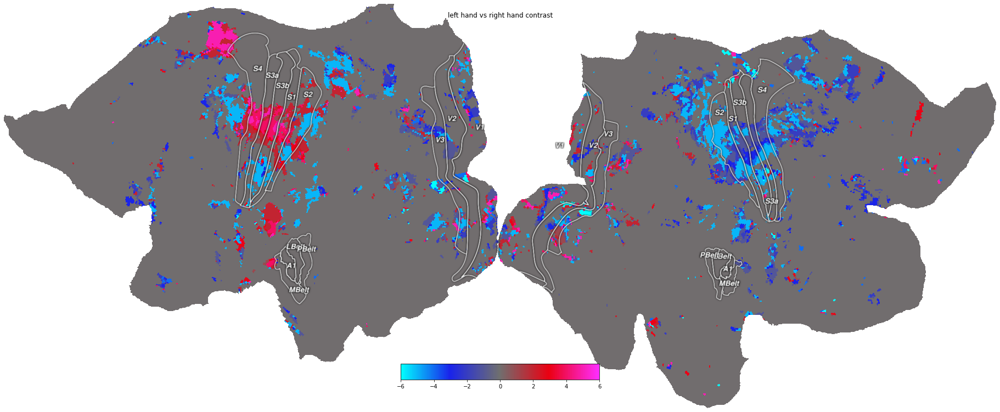

In [ ]:

gradient_series = np.zeros(new_betas.shape[0])

#find relationship between index from argmax and corresponding value
#index is [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
#['betas', 'eyebrows', 'eyes', 'mouth', 'tongue', 'lhand_fing1', 'lhand_fing2', 'lhand_fing3', 'lhand_fing4', 'lhand_fing5', 'lleg',  'rhand_fing1', 'rhand_fing2', 'rhand_fing3',
# 'rhand_fing4', 'rhand_fing5', 'rleg']
# [0,0,0,0,0,-5,-4,-3,-2,-1,0,1,2,3,4,5,0]

for i in range(new_betas.shape[0]):
  idx_max = np.argmax(new_betas[i])
  if idx_max > 10:
    gradient_series[i] = idx_max-10
  else:
    gradient_series[i] = -(10-idx_max)

#
t_hands = np.nan_to_num(t_hands)
idx = np.where(t_hands == 0)[0]

for i in idx:
  gradient_series[i] = 0



f2 = cx.quickshow(cx.Vertex(gradient_series, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-6, vmax=6));
f2.suptitle('left hand vs right hand contrast');



Failed to get connection
** (inkscape:3246): CRITICAL **: 15:58:56.433: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3246): CRITICAL **: 15:58:56.433: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3246): CRITICAL **: 15:58:56.433: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


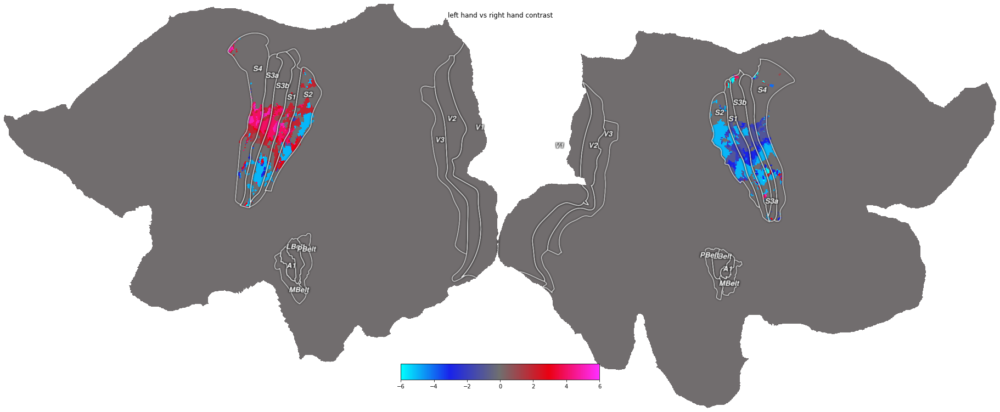

In [ ]:
places = [8,9,51,52,53]
gradient_series_new_hands = np.where(np.isin(atlas_data_both_hemis,places),gradient_series,0)
f2 = cx.quickshow(cx.Vertex(gradient_series_new_hands, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-6, vmax=6));
f2.suptitle('left hand vs right hand contrast');

[0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
[0, -2, -1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(17, 118584)
Failed to get connection
** (inkscape:3250): CRITICAL **: 15:59:01.031: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3250): CRITICAL **: 15:59:01.031: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3250): CRITICAL **: 15:59:01.031: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


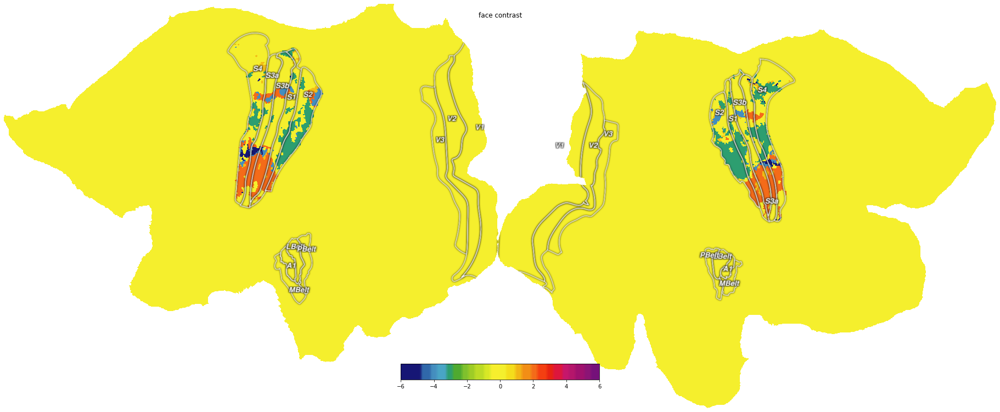

In [ ]:
##5
face = np.array([1 if 'hand' not in uet and 'leg' not in uet else 0 for uet in unique_event_types])
contrast_vector_face = np.r_[0, face] 
print(contrast_vector_face)

new_contrast_face = np.zeros(17)
new_contrast_face[1] = -2
new_contrast_face[2] = -1
new_contrast_face[3] = 1
new_contrast_face[4] = 2
fs = [int(x) for x in new_contrast_face]
print(fs)
t_face = generate_t_vals(contrast_vector_face, betas)
new_betas = betas.T*contrast_vector_face

gradient_series_face = np.zeros(new_betas.shape[0])

for i in range(new_betas.shape[0]):
  idx_max = np.argmax(new_betas[i])
  if idx_max/2 > 1:
    gradient_series_face[i] = idx_max-2
  else:
    gradient_series_face[i] = -idx_max - 3

#
t_face = np.nan_to_num(t_face)
idx = np.where(t_face == 0)[0]

for i in idx:
  gradient_series_face[i] = 0

places = [8,9,51,52,53]  # From dictionairy see Selecting ROI

gradient_series_new = np.where(np.isin(atlas_data_both_hemis,places),gradient_series_face,0)
f2 = cx.quickshow(cx.Vertex(gradient_series_new, subject='hcp_999999', cmap='J4', vmin=-6, vmax=6));
f2.suptitle('face contrast');

In [ ]:
##6 & 7


# Exploring the primary motor cortex

## Abstract

We applied the result of functional magnetic resonance imaging(fMRI) to look deeper into the primary motor cortex (Brodmann area 4). Subjects viewed a movie of an avatar that moved its facial muscles, hands and legs in a quasi-cyclic order that was identical across runs. On some cycles, subjects moved both hands/legs, and on some, they only moved one side. We investigated responses to movements in these areas. Different activation thresholds for different body parts were observed due to difference in sensitivity to movements according to the use/disuse of that specific body part. A large amount of activation was observed for the face, and activations dropped for movement of separate fingers. In addition, we have uncovered non monotonic representations in the hand movements. It was also marked that there are connected representations of the fingers in the orunary motor cortex.

## Introduction
An important principle of brain organization is topographic mapping of information. Penfield already showed that bodyparts that are in close proximity of, or adjacent to eachother are also mapped on the cortical surface in a very similar organization in humans(Penfield, 1937). He was able to show this mapping for the somatosensory information and for motor, though it now also has been shown for other areas. There was though an imbalance between the size of the body parts and the size of the brain areas controlling the bodypart. The distribution lead to the creation of the cortical homunculus. A cortical homunculus is a human but the size of the body part relates to the size of the brain surface that controls the bodyparts. (maybe add a figure). For the somatosenosory homunculus this resulted in a homunculus with big lips and big hands, in contrast with a smal thorax. With progression in technology in MRI-scanners we are able to look into more detail for the finegrained organization of the brain.
This experiment sets out to map the organization of the motor cortex for the face and hands.  Previous research focused on the somatosensory organization, this report sets out to look more into the motoric organization of the somatose. With the advances in MRI technology we are now more able to look at finegrained structures and this paper sets out to map different facial features and individual fingers.  

## Methods 

## Methods 
The experiment consisted of five runs on a singular subject. The subject moved 16 bodyparts consecutively. Those bodyparts are the eyebrows, mouth, tongue, left leg, right leg, finger 1-5 for the left hand, and finger 1-5 for the right hand. This created 16 unique event types corresponding to the 16 body parts. The experiment was mixed block and event design based. The order of movement for the bodyparts was the same between runs. A run went quasi cyclical through the unique event types, in some cycles there was movement of finger on both hands and othertimes only movement from one hand. The subject watched a movie with an avatar that instructed how and which bodypart to move. The subject moved each bodypart on average of 2.26 seconds with a 1 second of rest before the next bodypart was moved. 

 A run consisted of 141 TR with a TR of 1.6 seconds which makes it up about 225 seconds per run. Of which only 200 seconds was moved with the onset of the first movement after 12 seconds, so the last 13 seconds in the data are after the experiment is over. There were timeseries for every vertex according to the parcellation of the Humane Connectome project which resulted in 59000 vertexes per hemisphere, so a total of around 118000. 

 The data was preprocessed with fminiprep. We checked the data to confirm this, for temperal filtering was done with a periodogram, checked for zero covariance between residuals and equal variance for residuals. 

 The analysis of surface-based fMRI data consisted of fitting a general linear model on the data. Because of events in which the fingers were moved on both hands, we would not be able to create single regressor GLMS for the fingers. The activation for the other hand finger would also become explained by the single regressor. This would not be helpful for creating a map for the organization of the motor cortex based on voxel sensitivity per finger. Therefore a design matrix consisting of all regressors was created. We assumed the events to be instantaneous so every response function would behave the same. By convolving the neural timecourse with a single gamma HRF function the design matrix was created. We calculated the t-values from the preprocessed time course and the design matrix and with a threshold of 4 and would we map these on a flatmap to create the distribution of activation of voxels for different regressors.

By using different contrast vectors we could infer the activation distribution through the brain for different bodyparts. We first created a contrast between left en right hand. Then we looked at the activation for the face. After this we tried to map the fingers seperately in flatmaps. Then by choosing the maximum activation per finger for every voxel,  were we able to create a gradient map to see the organization of the hands in the somatosensory regions of the brain. We based our region of interest for this gradient map on where we found activation in the first map we created. We created a similar gradient for the face.. 

## Results

#### Preprocessing 

The data is z-scored and the percent signal is changed. No potential signal was considered as a spike and therefore no measures were taken. 
#### Tasks
When it comes to contrasting the t-statistics of the contralaterality of the "right hand" vs "left hand", the activations in the somatosensory and motor cortex confirm it as shown in the figure below. It shows the contralateral representation of the hand in the somatosensory and motor cortex region of the brain. Activations of the right hand (which were given positive values in the contrast vector) are represented in the left hemisphere of the brain shaded as pink, and vice versa for the representation of the left-hand side which is shaded as blue.	


(17, 118584)
Failed to get connection
** (inkscape:3254): CRITICAL **: 15:59:05.083: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3254): CRITICAL **: 15:59:05.083: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3254): CRITICAL **: 15:59:05.083: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


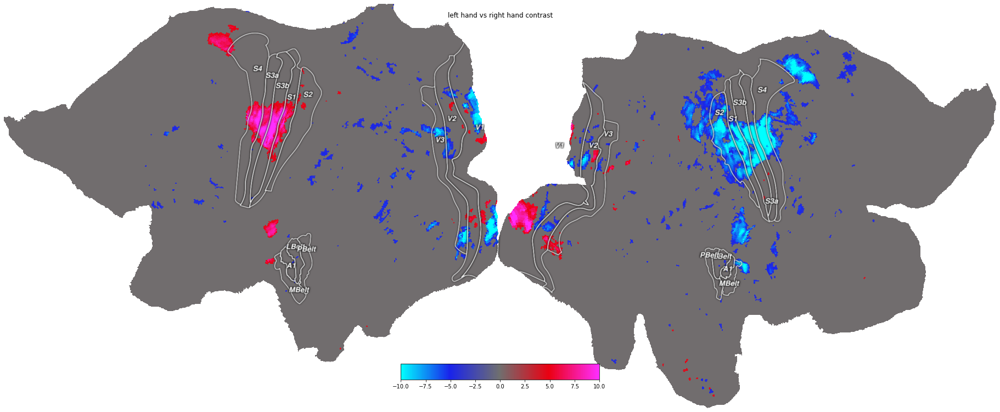

In [ ]:
f2 = cx.quickshow(cx.Vertex(generate_t_vals(contrast_vector_hands, betas), subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left hand vs right hand contrast');

The same t-statistics were calculated for the left foot vs. right foot, and the same pattern was observed only this time the contralaterality was not 100%. In addition, a clear difference in the area of activation for the hands and legs was observed. A significant amount of activation was also observed in the pre-motor cortex for the legs.


(17, 118584)
Failed to get connection
** (inkscape:3258): CRITICAL **: 15:59:09.334: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3258): CRITICAL **: 15:59:09.334: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3258): CRITICAL **: 15:59:09.334: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


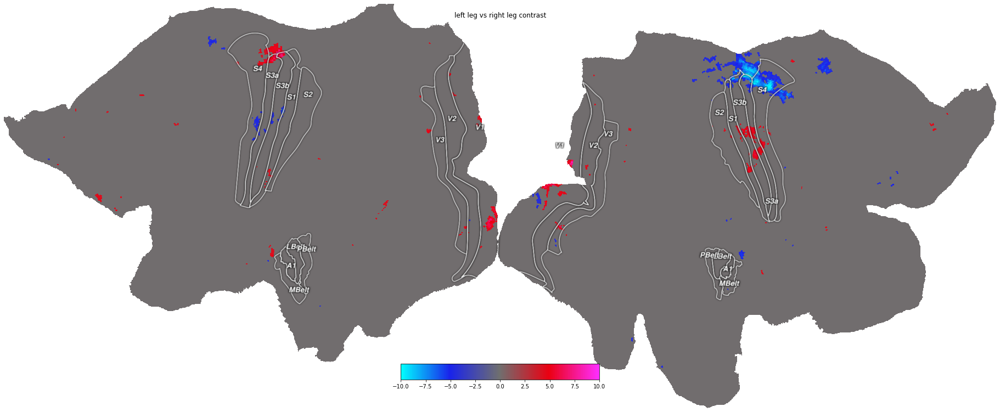

In [ ]:
f2 = cx.quickshow(cx.Vertex(generate_t_vals(contrast_vector_foot, betas), subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left leg vs right leg contrast');


Then the face was contrasted with an implicit baseline (an unbalanced contrast). As shown in the figure below it can be understood that there are lots of activations going on for the face, including outside of the region of interest. For this reason a hinger threshold of 5 was taken for the. The course map of faces, hands and feet are not contiguous because the regressors in our design matrix do not represent all the body parts that are present in the somatosensory mapping. For example, the hip, trunk, neck, head and arm are left out in our design matrix so it is bound to have some holes in our representations.

(17, 118584)
Failed to get connection
** (inkscape:3574): CRITICAL **: 16:22:18.284: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3574): CRITICAL **: 16:22:18.284: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3574): CRITICAL **: 16:22:18.284: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


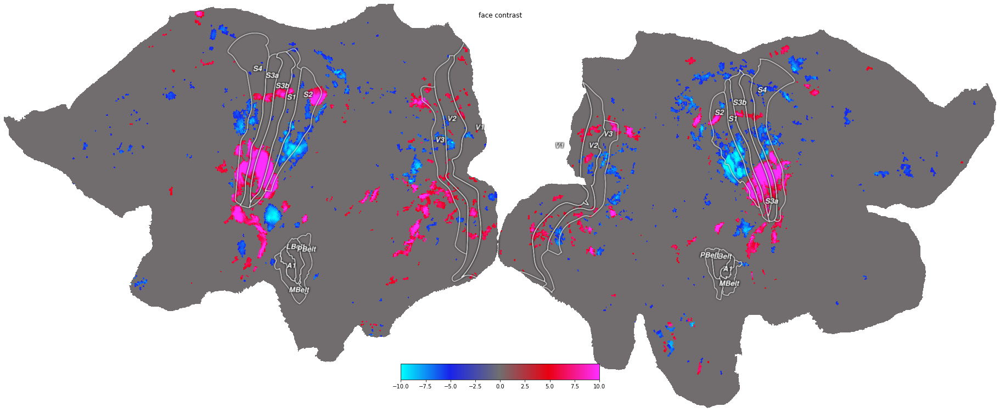

In [ ]:
f2 = cx.quickshow(cx.Vertex(generate_t_vals(contrast_vector_face, betas, 5), subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('face contrast');

A shift in the activation area of the motor cortex can be seen when each finger is contrasted and separated left vs right, Additional activations in other areas were observed which could be caused as the subject was also observing the motions on a screen, and it could be related to motor imagery. A lower threshold of 3 was taken for the activations of each finger on the flat map to observe a notable amount of activation.

[ 0  0  0  0  0 -1  0  0  0  0  0  1  0  0  0  0  0]
(17, 118584)
Failed to get connection
** (inkscape:3524): CRITICAL **: 16:20:28.312: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3524): CRITICAL **: 16:20:28.312: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3524): CRITICAL **: 16:20:28.312: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
[ 0  0  0  0  0  0 -1  0  0  0  0  0  1  0  0  0  0]
(17, 118584)
Failed to get connection
** (inkscape:3530): CRITICAL **: 16:20:33.553: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3530): CRITICAL **: 16:20:33.553: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3530): CRITICAL **: 16:20:33.553: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
[ 0  0  0  0  0  0  0 -1  0  0  0  0  0  1  0  0  0]
(17, 118584)
Failed to get connection
** (inkscape:3534): CRITICAL **: 16:20:37

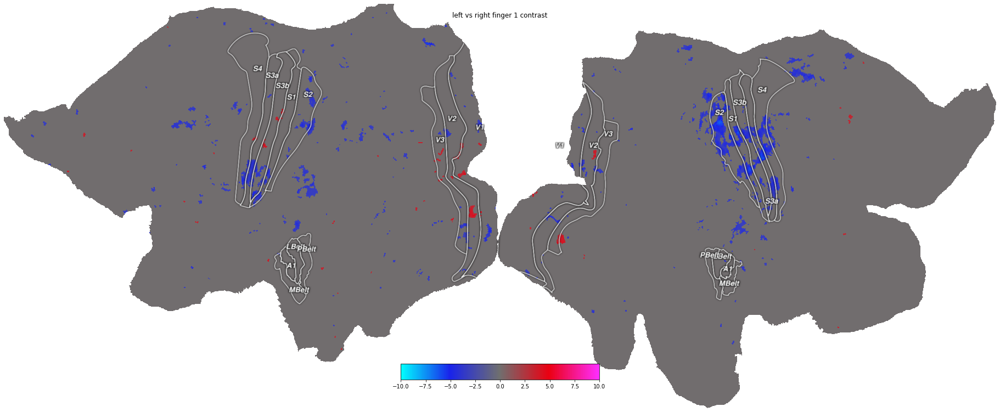

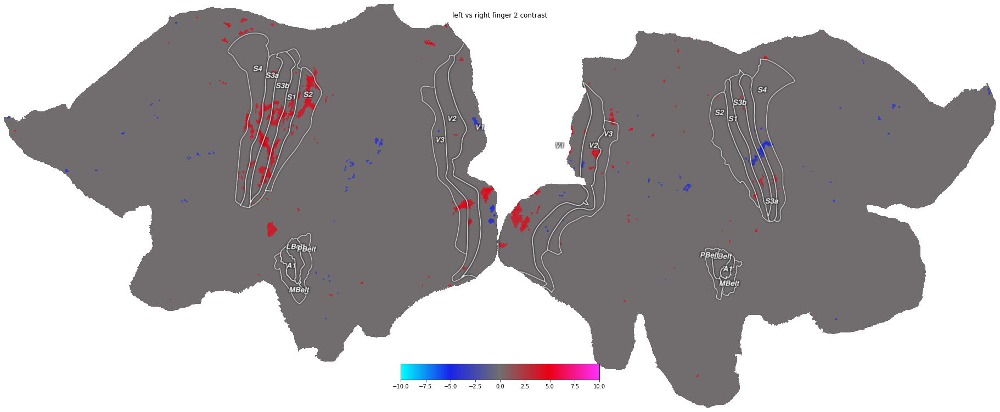

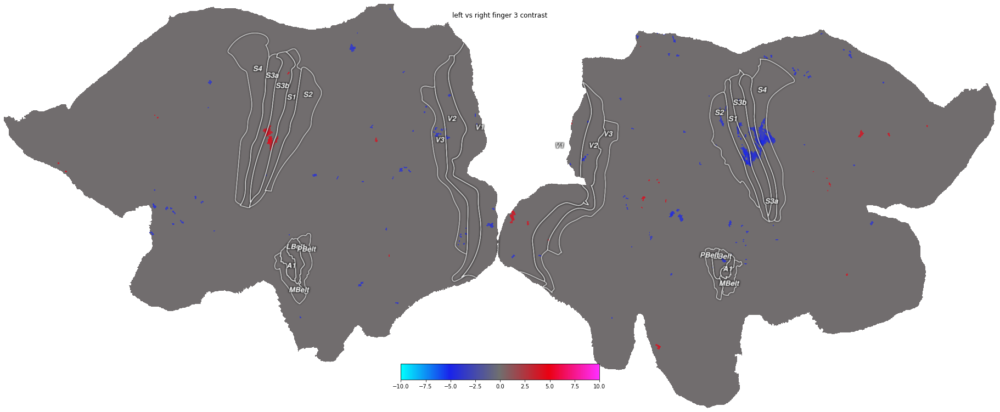

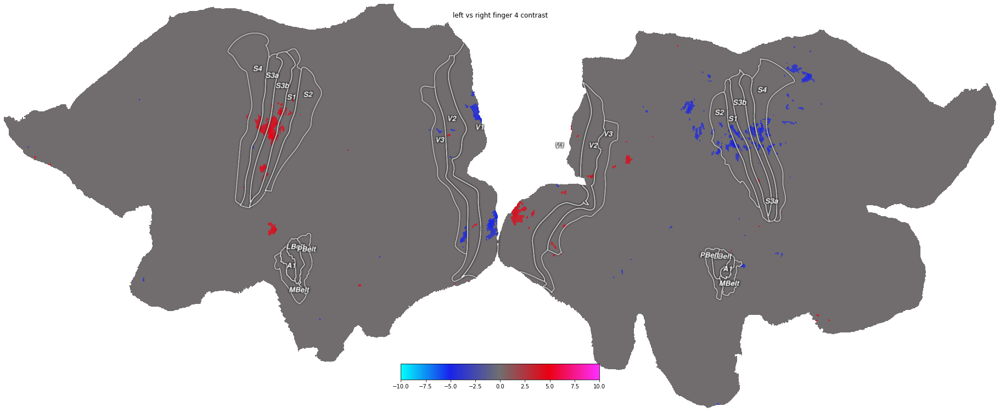

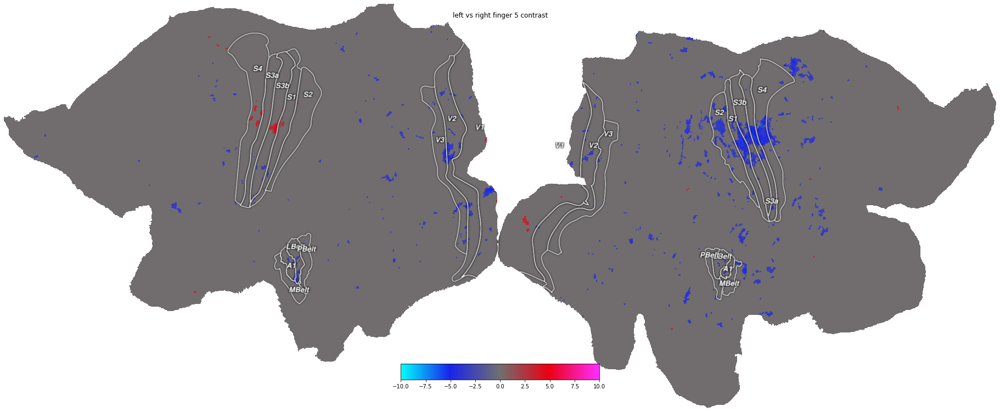

In [ ]:
fingers_index = [1, 2, 3, 4, 5]
for i in fingers_index:  
  rfinger = np.array([1 if uet.startswith('rhand') and uet.endswith(str(i)) else 0 for uet in unique_event_types])
  lfinger = np.array([-1 if uet.startswith('lhand') and uet.endswith(str(i)) else 0 for uet in unique_event_types])
  contrast_vector_each_finger = np.r_[0, rfinger+lfinger] # the intercept regressor was never in the event types list
  print(contrast_vector_each_finger)

  f2 = cx.quickshow(cx.Vertex(generate_t_vals(contrast_vector_each_finger, betas, 3), subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
  f2.suptitle('left vs right finger %d contrast' %i);


A somatic gradient was created on the surface for winning finger of each voxel  from left pinky to thumb and from the right thumb to right pinky. It is not monotonic as shown in the figure below. This could be explained in relation to sensorimotor integration. A study using a population receptive field approach shows that many neuronal populations respond to multiple finger movements, results showed largely connected patches of detailed connected finger representations were shown through the sensory-motor cortex (Schellekens, 2018). The subject’s movements also produced sensations in the somatosensory and motor cortex, and these strong activations can be seen in the map shown below.


Failed to get connection
** (inkscape:3285): CRITICAL **: 15:59:39.991: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3285): CRITICAL **: 15:59:39.991: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3285): CRITICAL **: 15:59:39.991: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


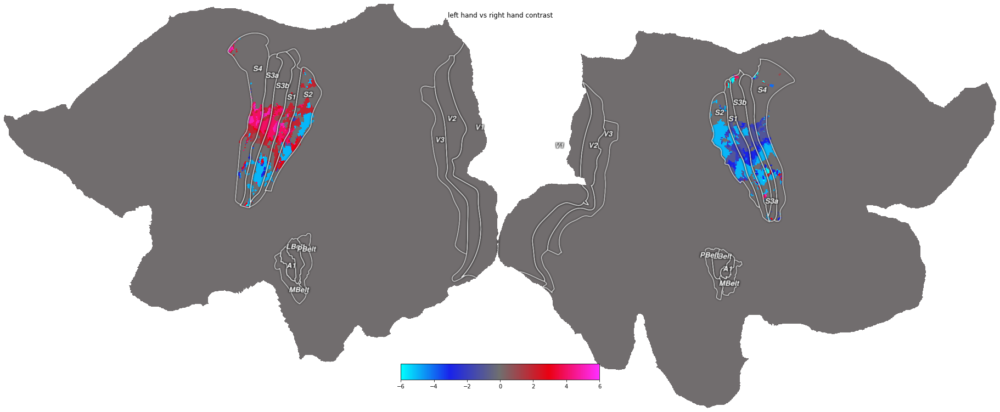

In [ ]:
places = [8,9,51,52,53]
gradient_series_new_hands = np.where(np.isin(atlas_data_both_hemis,places),gradient_series,0)
f2 = cx.quickshow(cx.Vertex(gradient_series_new_hands, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-6, vmax=6));
f2.suptitle('left hand vs right hand contrast');


The map is not monotonic. On the gradient representation of the face, top to bottom, it can be seen that the eye and the mouth are most strongly represented. Furthermore, somatotopic representation in the right hemisphere was slightly different from the left hemisphere. 
				

Failed to get connection
** (inkscape:3288): CRITICAL **: 15:59:43.907: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3288): CRITICAL **: 15:59:43.908: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3288): CRITICAL **: 15:59:43.908: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


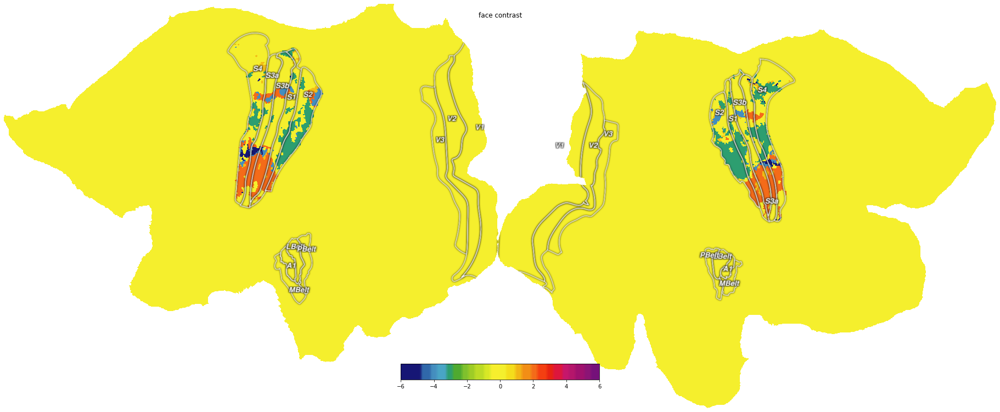

In [ ]:
gradient_series_new = np.where(np.isin(atlas_data_both_hemis,places),gradient_series_face,0)
f2 = cx.quickshow(cx.Vertex(gradient_series_new, subject='hcp_999999', cmap='J4', vmin=-6, vmax=6));
f2.suptitle('face contrast');

## Discussion

In this experiment, we have observed the representation of different body parts in the somatosensory cortex, specifically the primary motor cortex(Brodmann area 4). We have seen corresponding results to previous pieces of literature concerning the difference in the size of representation for different body parts according to their use/disuse. Certain parts of the body that can make the finest movement take up much more space than others. A lesser signal was observed for the legs than the hands; this could be due to the area's sensitivity to activation. According to our observation, the hands seemed to have a significantly lower threshold for activation, meaning higher response activation was observed for the movement when compared to the foot.

We have also discovered non-monotonic and slightly different representations in the two hemispheres for some body parts unlike the previous works studied.


### References 
1.  Bruce M. Koeppen MD, PhD, in Berne and Levy Physiology, 2018, https://www.sciencedirect.com/topics/immunology-and-microbiology/primary-motor-cortex
2. Muret, D., Root, V., Kieliba, P., Clode, D., & Makin, T. R. (2022). Beyond body maps: Information content of specific body parts is distributed across the somatosensory homunculus. Cell reports, 38(11), 110523.
4. WILDER PENFIELD, EDWIN BOLDREY, SOMATIC MOTOR AND SENSORY REPRESENTATION IN THE CEREBRAL CORTEX OF MAN AS STUDIED BY ELECTRICAL STIMULATION, Brain, Volume 60, Issue 4, December 1937, Pages 389–443, https://doi-org.vu-nl.idm.oclc.org/10.1093/brain/60.4.389
3. Schellekens, W., Petridou, N., & Ramsey, N. F. (2018). Detailed somatotopy in primary motor and somatosensory cortex revealed by Gaussian population receptive fields. Neuroimage, 179, 337-347.
